# <span style='font-family:"Times New Roman"'><strong><em> Explanatory variables selected via dissimilarity percentages analysis </em><strong> <span styel=''>
______________________________________________________________________________________________________________________________
The user has completed the basic analyses of microbiota data and would now like determine if and how communities differ by specific variables of interest via data fishing. This post hoc test answering the question ‘in which taxa is this difference most evident?’

In [1]:
import pandas as pd
import numpy as np
import json
import re
import csv

In [2]:
#!pip install ipywidgets
#!jupyter nbextension enable --py widgetsnbextension
#!pip install clustergrammer2
##!pip install --upgrade clustergrammer
#!pip install sklearn

In [3]:
#!jupyter labextension install @jupyter-widgets/jupyterlab-manager
#!jupyter nbconvert --to html notebook.ipynb

In [4]:
#<img src="carheatmap.jpg"/>

##### Install the clustergrammer and import necessary programs

In [5]:
import sklearn
import ipywidgets as widgets
from clustergrammer2 import net

>> clustergrammer2 backend version 0.5.23


In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## <span style='font-family:"Times New Roman"'><strong><em> Reviewing the background concept of narrowing down operational taxonomic units using similarity percentages analysis </em><strong> <span styel=''>
______________________________________________________________________________________________________________________________
> ### <span style='font-family: "Times New Roman"'> Traditional ways for decreasing the number of OTUs you’re looking at
>> ### <span style='font-family: "Times New Roman"'> A. You could apply a "frequency" cutoff such as only looking at OTUs/taxa that occur in at least 50% of samples.
>> ### <span style='font-family: "Times New Roman"'> B. You can apply an "abundance" cutoff such as only looking at OTUs/taxa that are at least 1% abundance in at least one sample. 
>> ### <span style='font-family: "Times New Roman"'> C. Don’t use OTUs. You can add together genus or family groups and test if all or some of these taxa differ across variables of interest. 
>> ### <span style='font-family: "Times New Roman"'> Usually, the user chooses a combination of B and C. Unfortunately, these methods are arbitrary. How do you pick an abundance or frequency cutoff? What if a low abundant OTU is of interest? And what if you are interested in possible species-level differences (OTUs) so high taxonomic levels aren’t useful? 
<span style=''>

## <span style='font-family:"Times New Roman"'><strong><em> Quantifying OTU prominence using similarity percentages (i.e. SIMPER) clustering methods </em><strong> <span styel=''>
______________________________________________________________________________________________________________________________
>> ### <span style='font-family:"Times New Roman"'> SIMPER identifies the OTUs that most contribute to beta-diversity measures. These OTUs are the most abundant and/or most variable OTUs in the data set. The SIMPER list comprises OTUs which cumulatively explain 70%+ of the variation between each comparison.
>> ### <span style='font-family:"Times New Roman"'> (Dis)similarity analysis is a traditionally legitimate way to explore variability in community composition in order to understand where community associations exist. Dissimilarity clusters are calculated based on the contribution of each species (%) to the dissimilarity between the clusters. The operational taxonomic units (OTUs) are organized based on the highest ratio of dissimilarity and standard deviation (i.e. DISS/SD) derived from SIMPER dissimilarity clusters.  
>> ### <span style='font-family:"Times New Roman"'>(Dis)similarity analyses are critizised of mis-specifying the mean-variance relationship present in count data (such as abundance data), confounding location and dispersion effects in ordinations, misleading results when trying to identify taxa in which an effect is expressed, and the failure to detect a multivariate effect unless it is expressed in high‐variance taxa. https://besjournals.onlinelibrary.wiley.com/doi/full/10.1111/j.2041-210X.2011.00127.x

#  <span style='font-family:"Times New Roman"'><strong><em> Taxonomy Parsing </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________
> ### <span style='font-family:"Times New Roman"'> First, we parse through the taxonomy file to determine the most explanatory taxa for each OTU.
  
<span style=''>

In [7]:
df = pd.read_csv('Bananas_cons_taxonomy_V2.csv', sep=',', index_col=[0])
df.dtypes

Size           int64
Taxonomy      object
Taxonomy.2    object
Taxonomy.3    object
Taxonomy.4    object
Taxonomy.5    object
Taxonomy.6    object
dtype: object

In [8]:
df['Taxonomy_filter'] = df[['Taxonomy', 'Taxonomy.2', 'Taxonomy.3', 'Taxonomy.4', 'Taxonomy.5', 'Taxonomy.6']].apply(lambda x: '.'.join(x), axis=1)
print(df['Taxonomy_filter'].head(1))

OTU
Otu0001    Bacteria(100).Proteobacteria(100).Gammaproteob...
Name: Taxonomy_filter, dtype: object


In [9]:
df['Taxonomy_filter'] = df['Taxonomy_filter'].str.replace(r"\([^()]*\)","")
df['Taxonomy.6'] = df['Taxonomy.6'].str.replace(r"\([^()]*\)","")
df['Taxonomy.5'] = df['Taxonomy.5'].str.replace(r"\([^()]*\)","")
df['Taxonomy.4'] = df['Taxonomy.4'].str.replace(r"\([^()]*\)","")
df['Taxonomy.3'] = df['Taxonomy.3'].str.replace(r"\([^()]*\)","")
df['Taxonomy.2'] = df['Taxonomy.2'].str.replace(r"\([^()]*\)","")
df['Taxonomy'] = df['Taxonomy'].str.replace(r"\([^()]*\)","")
df.head()

,Size,Taxonomy,Taxonomy.2,Taxonomy.3,Taxonomy.4,Taxonomy.5,Taxonomy.6,Taxonomy_filter
OTU,,,,,,,,
Otu0001,56610,Bacteria,Proteobacteria,Gammaproteobacteria,Xanthomonadales,Rhodanobacteraceae,Rhodanobacter,Bacteria.Proteobacteria.Gammaproteobacteria.Xa...
Otu0002,36291,Bacteria,Bacteroidetes,Bacteroidia,Chitinophagales,Chitinophagaceae,uncultured,Bacteria.Bacteroidetes.Bacteroidia.Chitinophag...
Otu0003,27416,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,Pseudarthrobacter,Bacteria.Actinobacteria.Actinobacteria.Microco...
Otu0004,15775,Bacteria,Bacteroidetes,Bacteroidia,Sphingobacteriales,Sphingobacteriaceae,Mucilaginibacter,Bacteria.Bacteroidetes.Bacteroidia.Sphingobact...
Otu0005,15230,Bacteria,Proteobacteria,Gammaproteobacteria,Betaproteobacteriales,Burkholderiaceae,Burkholderia-Caballeronia-Paraburkholderia,Bacteria.Proteobacteria.Gammaproteobacteria.Be...


In [10]:
taxlist = ['ph','cl', 'or', 'fa', 'ge','sp']
for i, row in df.iterrows():
    gen = 0
    while (True):
        gen-=1
        #print(row["Taxonomy_filter"].split('.'))
        cltaxon = row["Taxonomy_filter"].split('.')  if not row["Taxonomy_filter"].split('.')[gen].endswith(('_unclassified', '_ge', 'uncultured','_fa','_or','_cl','_Family'))  else row["Taxonomy_filter"].split('.')[0:gen] 
        
        if not cltaxon[-1].endswith(('_unclassified','_ge', 'uncultured','_fa','_or','_cl','_Family')):
        #,'6G20','9454','0119','AD3','H03','49','67','MND1','1323','426','UTBCD1','04','67-14','26256','WPS-2','37-13','473','-27','-11','TA06','4-29-1','-1554','-96','A0839','41','E6','-32','C25','-3','56','-191','A2','48'
            break
        else:
            continue
    df.loc[i, "Taxonomy_filter"] = cltaxon[-1] +'.'+str(taxlist[len(cltaxon)-1])
df.head()

,Size,Taxonomy,Taxonomy.2,Taxonomy.3,Taxonomy.4,Taxonomy.5,Taxonomy.6,Taxonomy_filter
OTU,,,,,,,,
Otu0001,56610,Bacteria,Proteobacteria,Gammaproteobacteria,Xanthomonadales,Rhodanobacteraceae,Rhodanobacter,Rhodanobacter.sp
Otu0002,36291,Bacteria,Bacteroidetes,Bacteroidia,Chitinophagales,Chitinophagaceae,uncultured,Chitinophagaceae.ge
Otu0003,27416,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,Pseudarthrobacter,Pseudarthrobacter.sp
Otu0004,15775,Bacteria,Bacteroidetes,Bacteroidia,Sphingobacteriales,Sphingobacteriaceae,Mucilaginibacter,Mucilaginibacter.sp
Otu0005,15230,Bacteria,Proteobacteria,Gammaproteobacteria,Betaproteobacteriales,Burkholderiaceae,Burkholderia-Caballeronia-Paraburkholderia,Burkholderia-Caballeronia-Paraburkholderia.sp


In [11]:
#pattern = '|'.join(['.sp1','_ge'])
df['Taxonomy_filter'] = df['Taxonomy_filter'].str.replace('_.', '.')
#df['Taxonomy_filter'] = df['Taxonomy_filter'].str.replace('..', '.')
df.to_csv('taxafiltered_8_26_2020.csv') 
dft = df[['Size', 'Taxonomy_filter']]

#  <span style='font-family:"Times New Roman"'><strong><em> Frequency and Abundance Cutoff </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________
> ### <span style='font-family:"Times New Roman"'> Optional, we place a frequency or abundance cutoff on the abundance dataframe. 
<span style=''>

In [12]:
dfb = pd.read_csv('Corrected_banana_shared_V2.csv', sep=',', index_col=[0])
dfb.head(20)

,P0B0_R10,P4B1_R10,P0B0_R6,P0B3_R9,P0B1_R11,P0B1_R12,P0B3_R10,P0B3_R12,P0B1_R10,P12B0R12,...,P12B3_R9,P4B0_R10,P4B0_R11,P4B0_R9,P0B0_R11,P4B1_R11,P4B1_R9,P4B3_R10,P4B3_R11,P4B3_R9
OTU,,,,,,,,,,,,,,,,,,,,,
Otu0001,338,433,439,629,806,652,696,49,1239,825,...,1173,802,650,1680,1028,746,878,770,826,1132
Otu0002,498,513,792,30,345,939,446,48,153,156,...,822,1039,1041,1455,102,291,437,303,533,283
Otu0003,241,360,130,224,284,129,838,479,101,1213,...,221,235,274,132,276,400,517,78,543,296
Otu0004,70,44,1,1,42,62,0,13,36,50,...,231,695,228,297,571,130,377,42,211,340
Otu0005,144,10,301,12,88,1092,383,135,1894,12,...,553,155,8,77,28,29,107,96,258,67
Otu0006,55,319,205,15,67,65,101,48,272,4,...,318,221,94,159,141,84,281,157,242,340
Otu0007,11,26,5,1,5,8,0,0,8,58,...,47,48,386,36,28,54,99,45,5,329
Otu0008,80,31,27,3,27,10,6,0,36,147,...,101,204,269,170,84,51,113,110,251,127
Otu0009,119,698,250,0,73,379,4,32,75,0,...,9,9,76,30,33,73,1,1,270,373


#  <span style='font-family:"Times New Roman"'><strong><em> SIMPER Parser </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________
> ### <span style='font-family:"Times New Roman"'> Finally, we parse through the SIMPER file from the PRIMER software to extract the information about the dissimilarity analysis.
<span style=''>

In [13]:
## Collect results from groups_Biochar_SIMPER_002 but remember to delete similarity info from file, compile averages of all OTUs 
def simperParser(filename):
    errors = []
    otuDic = {}
    with open(filename) as f:

        line = f.readline()
        while line:
            if line.startswith("Species"):
                linenum= 0
                line= f.readline()
                while(line.startswith("Otu")): 


                    linenum += 1
                    feature = line.split('\t')

                    if feature[0] in otuDic:
                        freq = 1 + otuDic[feature[0]][0]
                        abund1 = float(feature[1]) + otuDic[feature[0]][1]
                        abund2 = float(feature[2]) + otuDic[feature[0]][2]
                        avDiss = float(feature[3]) + otuDic[feature[0]][3]
                        dissSd = float(feature[4]) + otuDic[feature[0]][4]
                        Contrib = float(feature[5]) + otuDic[feature[0]][5]
                        cum = float(feature[6])+ otuDic[feature[0]][6]
                        otuDic[feature[0]] = [freq, abund1, abund2, avDiss, dissSd, Contrib, cum]
                    else:
                        freq = 1
                        abund1 = float(feature[1])
                        abund2 = float(feature[2])
                        avDiss = float(feature[3])
                        dissSd = float(feature[4])
                        Contrib = float(feature[5])
                        cum = float(feature[6])
                        otuDic[feature[0]] = [freq, abund1, abund2, avDiss, dissSd, Contrib, cum]

                    line = f.readline()
            else:
                line = f.readline()
                continue

    df = pd.DataFrame.from_dict(otuDic , orient='index', columns=['Frequency', 'AvAbund1', 'AvAbund2', 'AvDiss', 'DissSD', 'Contrib', 'Cum'])
    df.iloc[:, 1:7]= df.iloc[:, 1:7].div(df.Frequency, axis=0)
    df['AvAbundSub'] = abs(df['AvAbund1'] - df['AvAbund2'])
    df['SD'] = df['AvDiss']/df['DissSD']
    df = df.sort_values('DissSD', ascending=False) #dropped the duplicates#dropped the duplicates
    return(df)

#  <span style='font-family:"Times New Roman"'><strong><em> 1. Lead Clustering Analysis </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________
<span style='font-family:"Times New Roman"'><font color='black'> This analysis includes feedback about the 20 most highest ranked "taxonomies", 2D heatmaps of the most prominent operations taxonomic units (OTUs), and interactive heatmaps displaying the same OTUs. </font><span styel=''>

In [14]:
### 1. Filter and extract OTUs based on Diss/SD (i.e. the quotient of dissimilarity and standard deviation) from the SIMPER file 
df1 = simperParser("pbsimpertxt.txt")
df2 = dft.loc[df1.index]
df23 = df2.join(df1, lsuffix='_caller', rsuffix='_other') 
df3 = df23.join(dfb, lsuffix='_caller', rsuffix='_other')
df3.to_csv('GrandListPbxV22revised.csv',index=True, sep=',')
df5 = df3.sort_values('DissSD', ascending=False)
df4 = df3.sort_values('AvAbundSub', ascending=False)

In [15]:
### Establish a new index based on the taxonomy column
indexlist1 = []
dff3 = df4.index.tolist() #need a list, and index doesnt necessarilly give you a list
dff4 = pd.DataFrame(dff3, columns=["Otu"]).head(250)

In [16]:
### Creating a barplot that highlights top taxa
dftax3 = df5.groupby('Taxonomy_filter').sum()
dftax5 = dftax3.sort_values('DissSD', ascending=False)
dftax5.to_csv('GrandListPbxV22file7sum.csv',index=True, sep=',')

In [17]:
dftax5.drop(['Frequency', 'AvAbund1', 'Size', 'AvAbund2', 'AvDiss', 'DissSD', 'Contrib', 'Cum', 'AvAbundSub', 'SD'], axis=1, inplace=True)
dfin=dftax5.head(20)
dfin.columns = ['P0_B0_R10', 'P4_B1_R10', 'P0_B0_R6', 'P0_B3_R9',
                'P0_B1_R11', 'P0_B1_R12', 'P0_B3_R10', 'P0_B3_R12', 'P0_B1_R10',
                'P12_B0_R12', 'P12_B0_R11', 'P12_B0_R9', 'P12_B1_R10', 'P12_B1_R11',
                'P12_B1_R9', 'P12_B3_R10', 'P12_B3_R11', 'P12_B3_R9', 'P4_B0_R10',
                'P4_B0_R11', 'P4_B0_R9', 'P0_B0_R11', 'P4_B1_R11', 'P4_B1_R9',
                'P4_B3_R10', 'P4_B3_R11', 'P4_B3_R9'] 
#dfin.head()

In [18]:
i = 0
f =0 
df6 = pd.DataFrame(columns=['idx', 'Taxa', 'Total Relative Abundance', 'Lead', 'Biochar', 'Replicate'])
for j, row in dfin.iterrows():
    f+=1
    idx = 0
    for col in row.index:
        if '_' in col:
            idx += 1
            colist = col.split('_')
            #print(j)
            df6.loc[i] = [f-1, j , row[idx-1], colist[0][1:], colist[1][1:], colist[2][1:]]
            i+=1

df6['Lead'] = [int(x) for x in df6['Lead']]
#df6.head()

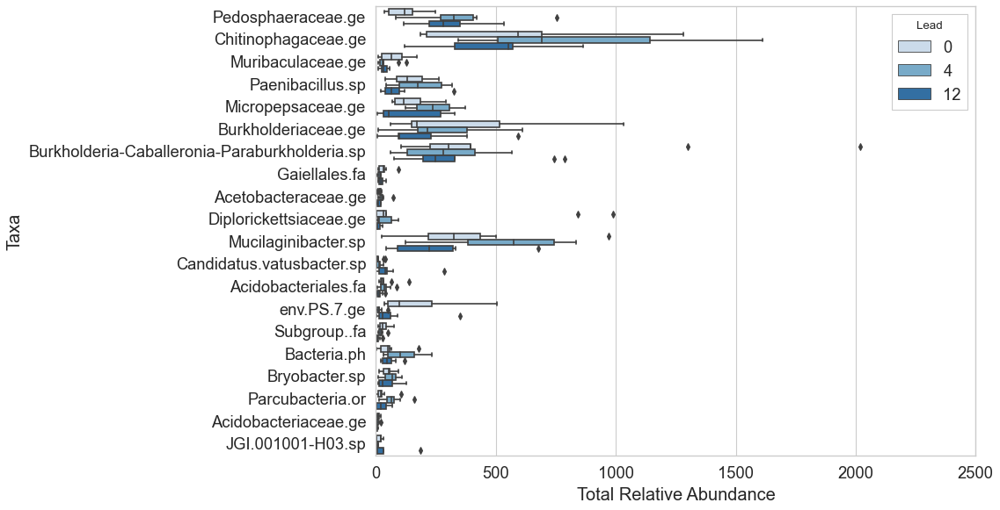

In [19]:
plt.style.use('classic')
sns.set(rc={'figure.figsize':(11, 8)}, font_scale=1.5, style='whitegrid') 
sns.boxplot(y='Taxa', x='Total Relative Abundance', 
            data=df6, 
            palette="Blues",
            hue='Lead');
#plt.savefig('svm_confad.jpg', dpi=400)

In [20]:
### 2. Average the replicates, and select out the averaged abundance of each OTUs for 9 treatments
df5.drop(['Taxonomy_filter', 'Frequency', 'AvAbund1', 'Size', 'AvAbund2', 'AvDiss', 'DissSD', 'Contrib', 'Cum', 'AvAbundSub'], axis=1, inplace=True)
headers = df5.index.values
df5.columns = df5.columns.str.strip().str.lower().str.replace(' ', '_')
df5['P0B0,Lead: 0,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p0b0')]].mean(axis=1)
df5['P0B1,Lead: 0,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p0b3')]].mean(axis=1)
df5['P0B3,Lead: 0,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p0b1')]].mean(axis=1)
df5['P4B0,Lead: 4,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p4b0')]].mean(axis=1)
df5['P4B1,Lead: 4,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p4b1')]].mean(axis=1)
df5['P4B3,Lead: 4,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p4b3')]].mean(axis=1)
df5['P12B0,Lead: 12,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p12b0')]].mean(axis=1)
df5['P12B1,Lead: 12,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p12b1')]].mean(axis=1)
df5['P12B3,Lead: 12,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p12b3')]].mean(axis=1)
df7 = df5.iloc[:, -9:]

In [21]:
### 3. Keep the replicates and just select out the abundance value of each of the selected OTUs for 27 treatments
cols1 = []
df7 = df7.rename(columns = lambda x: "("+x+")")
col1 = df7.columns.tolist()
cols1 = [tuple(x.replace("(", "").replace(")", "").replace(' ', '').replace(':', ': ').split(",")) for x in col1]

In [22]:
dff4.set_index("Otu", inplace = True)
rows = []
for otu in df7.index:
    if otu in dff4.index:
        rows.append((otu, 'Abund: present'))
    else:
        rows.append((otu, 'Abund: not'))

df3 = pd.DataFrame(data=df7.values, columns=cols1, index=rows).head(250)

>> ### <span style='font-family:"Times New Roman"'> Prominent operational taxonomic units (OTUs) and their interactions with the treatment. <span styel=''>

In [23]:
red1 = df7
red1.columns = ['P0B0', 'P0B1', 'P0B3', 'P4B0','P4B1', 'P4B3', 'P12B0', 'P12B1', 'P12B3'] 
red1.to_csv('lead_red1.csv',index=True, sep=',') 
red1 = red1.head(25)

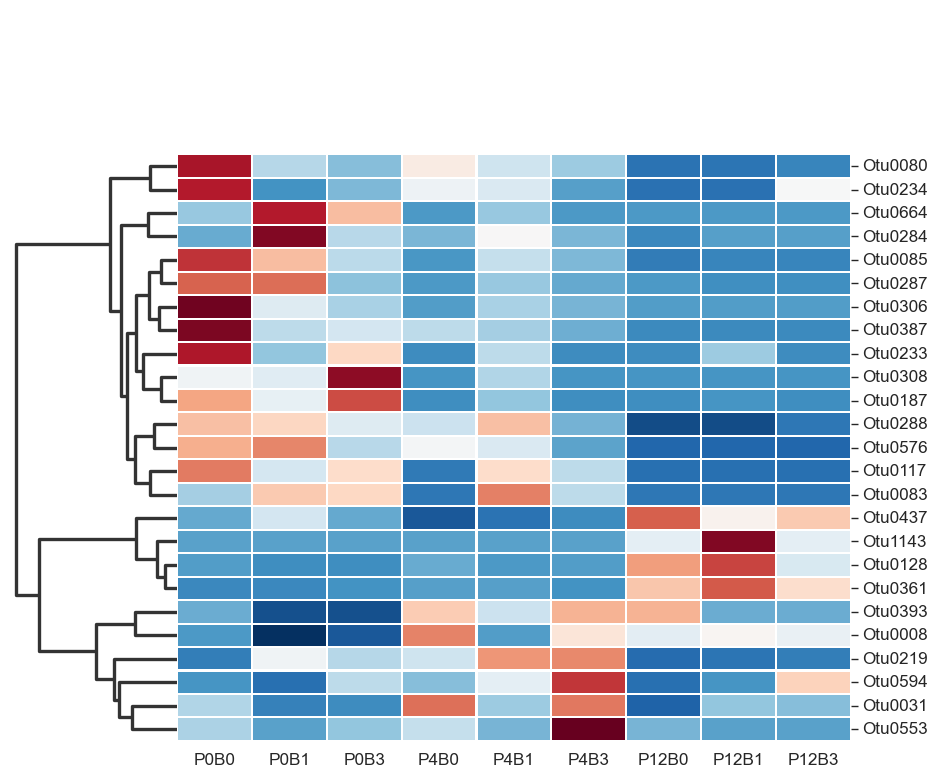

In [24]:
sns.set(font_scale=1.4, font="Arial") # set fontsize 2

g = sns.clustermap(red1, metric="braycurtis", 
               z_score=2, method="average", 
               cmap="RdBu_r",
               col_cluster=False,
               figsize=(12, 10),
               linewidths=1
               #yticklabels=False
              );
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(3)
    
ax = g.ax_heatmap
ax.set_xlabel("")
ax.set_ylabel("")
g.cax.set_visible(False)
    
plt.savefig('heatmap_with_Seaborn_clustermap_python_pbx_50V23.jpg', dpi=150, figsize=(20,18));

In [25]:
## 4. Interactive heatmap based on Bray Curtis dissimilarity with z-score normalization

In [26]:
## Interactive heatmap
net.load_df(df3)
net.normalize(axis='row', norm_type='zscore')

>> ### <span style='font-family:"Times New Roman"'><font color='black'> Fifty of the most prominent operational taxonomic units (OTUs) in the form of an interactive heatmap. </font><span styel=''>

In [27]:
net.cluster(dist_type='braycurtis', run_clustering=True, dendro=True, views=['N_row_sum', 'N_row_var'], linkage_type='average', sim_mat=False, filter_sim=0.1, calc_cat_pval=False, run_enrichr=None, enrichrgram=True)
net.widget()

ExampleWidget(network='{"row_nodes": [{"name": "Otu0308", "ini": 250, "clust": 240, "rank": 34, "rankvar": 51,…

### <span style='font-family:"Times New Roman"'> Additionally, we used another equation to decide the top fifty operational taxonomic units based on *|abund(i)-abund(j)|*. These results are indicated on the y axis of the interactive heatmap. Again, the secondary rhetoric of decision using the abundance equation is indicated by the dark blue color on the y axis of the interactive map.  

#  <span style='font-family:"Times New Roman"'><strong><em> 2. Biochar Clustering Analysis </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________


In [28]:
### 1. Filter and extract fifty OTUs based on Diss/SD (i.e. the quotient of dissimilarity and standard deviation) from the SIMPER file 
df1 = simperParser("biocharsimpertxt.txt")
df2 = dft.loc[df.index]
df23 = df2.join(df1, lsuffix='_caller', rsuffix='_other')
df3 = df23.join(dfb, lsuffix='_caller', rsuffix='_other')
df3.to_csv('GrandListBioV22revised.csv',index=True, sep=',') 
df3.head(20)
df5 = df3.sort_values('DissSD', ascending=False)
df4 = df3.sort_values('AvAbundSub', ascending=False)

In [29]:
### Establish a new index based on the otu column
indexlist1 = []
dff3 = df4.index.tolist() #need a list, and index doesnt necessarilly give you a list
dff4 = pd.DataFrame(dff3, columns=["Otu"]).head(250)

In [30]:
### Creating a barplot that highlights the top 25 families
dftax3 = df5.groupby('Taxonomy_filter').sum()
dftax5 = dftax3.sort_values('DissSD', ascending=False)
dftax5.to_csv('GrandListBioV22file7sum.csv',index=True, sep=',')
dftax5.drop(['Frequency', 'AvAbund1', 'Size', 'AvAbund2', 'AvDiss', 'DissSD', 'Contrib', 'Cum', 'AvAbundSub', 'SD'], axis=1, inplace=True)
dfin=dftax5.head(20)
dfin.columns = ['P0_B0_R10', 'P4_B1_R10', 'P0_B0_R6', 'P0_B3_R9',
                'P0_B1_R11', 'P0_B1_R12', 'P0_B3_R10', 'P0_B3_R12', 'P0_B1_R10',
                'P12_B0_R12', 'P12_B0_R11', 'P12_B0_R9', 'P12_B1_R10', 'P12_B1_R11',
                'P12_B1_R9', 'P12_B3_R10', 'P12_B3_R11', 'P12_B3_R9', 'P4_B0_R10',
                'P4_B0_R11', 'P4_B0_R9', 'P0_B0_R11', 'P4_B1_R11', 'P4_B1_R9',
                'P4_B3_R10', 'P4_B3_R11', 'P4_B3_R9'] 
#dfin.head(20)

In [31]:
i = 0
f =0 
df6 = pd.DataFrame(columns=['idx', 'Taxa', 'Total Relative Abundance', 'Lead', 'Biochar', 'Replicate'])
for j, row in dfin.iterrows():
    f+=1
    idx = 0
    for col in row.index:
        if '_' in col:
            idx += 1
            colist = col.split('_')
            #print(j)
            df6.loc[i] = [f-1, j , row[idx-1], colist[0][1:], colist[1][1:], colist[2][1:]]
            i+=1
#df6['Relative Abundance'] = [int(x) for x in df6['Relative Abundance']] 
df6['Biochar'] = [int(x) for x in df6['Biochar']]

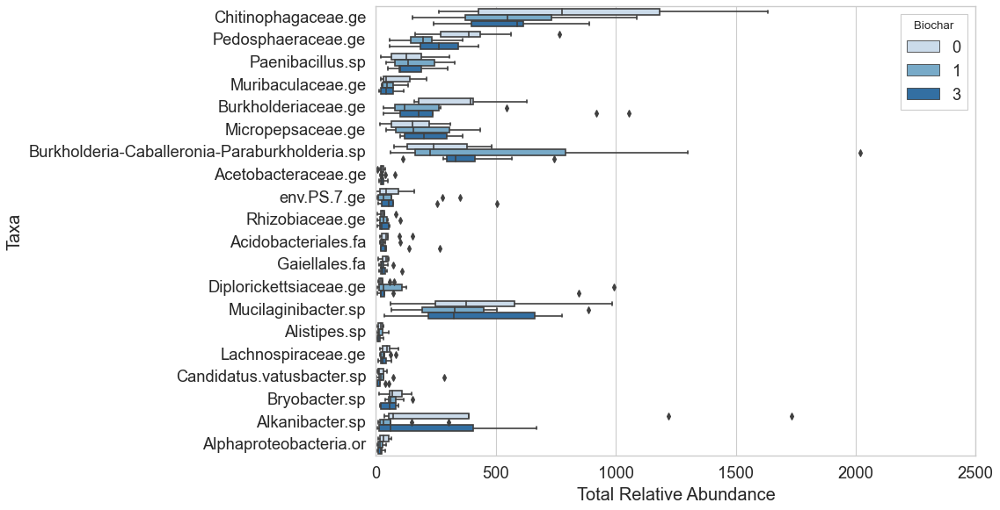

In [32]:
plt.style.use('classic')
sns.set(rc={'figure.figsize':(11, 8)}, font_scale=1.5, style='whitegrid')
sns.boxplot(y='Taxa', x='Total Relative Abundance', 
            data=df6, 
            palette="Blues",
            hue='Biochar');
#plt.savefig('svm_confbe.jpg', dpi=400)

In [33]:
### 2. Average the replicates in the OTUs, and select out the averaged abundance value of each of the selected OTUs for 9 treatments
df5.drop(['Taxonomy_filter', 'Frequency', 'AvAbund1', 'Size', 'AvAbund2', 'AvDiss', 'DissSD', 'Contrib', 'Cum', 'AvAbundSub'], axis=1, inplace=True)
headers = df5.index.values
df5.columns = df5.columns.str.strip().str.lower().str.replace(' ', '_')
df5['P0B0,Lead: 0,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p0b0')]].mean(axis=1)
df5['P0B1,Lead: 0,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p0b3')]].mean(axis=1)
df5['P0B3,Lead: 0,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p0b1')]].mean(axis=1)
df5['P4B0,Lead: 4,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p4b0')]].mean(axis=1)
df5['P4B1,Lead: 4,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p4b1')]].mean(axis=1)
df5['P4B3,Lead: 4,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p4b3')]].mean(axis=1)
df5['P12B0,Lead: 12,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p12b0')]].mean(axis=1)
df5['P12B1,Lead: 12,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p12b1')]].mean(axis=1)
df5['P12B3,Lead: 12,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p12b3')]].mean(axis=1)
df7 = df5.iloc[:, -9:]

In [34]:
cols1 = []
df7 = df7.rename(columns = lambda x: "("+x+")")
col1 = df7.columns.tolist()
cols1 = [tuple(x.replace("(", "").replace(")", "").replace(' ', '').replace(':', ': ').split(",")) for x in col1]

In [35]:
dff4.set_index("Otu", inplace = True)
rows = []
for otu in df7.index:
    if otu in dff4.index:
        rows.append((otu, 'Abund: present'))
    else:
        rows.append((otu, 'Abund: not'))

df3 = pd.DataFrame(data=df7.values, columns=cols1, index=rows).head(250)

>> ### <span style='font-family:"Times New Roman"'> Prominent operational taxonomic units (OTUs) and their interactions with the treatment. <span styel=''>

In [36]:
red1 = df7
red1.columns = ['P0B0', 'P0B1', 'P0B3', 'P4B0','P4B1', 'P4B3', 'P12B0', 'P12B1', 'P12B3'] 
red1.to_csv('biochar_red1.csv',index=True, sep=',') 
red1 = red1.head(25)

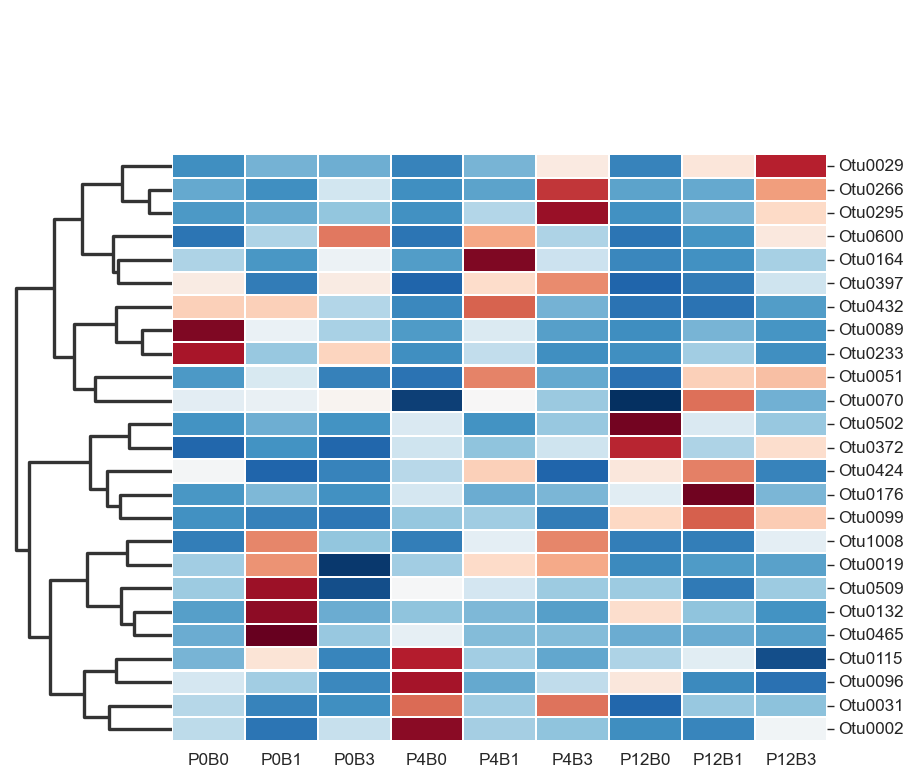

In [37]:
sns.set(font_scale=1.4, font="Arial") # set fontsize 2

g = sns.clustermap(red1, metric="braycurtis", 
               z_score=2, method="average", 
               cmap="RdBu_r",
               col_cluster=False,
               figsize=(12, 10),
               linewidths=1
               #yticklabels=False
              );
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(3)
    
ax = g.ax_heatmap
ax.set_xlabel("")
ax.set_ylabel("")
g.cax.set_visible(False)
    
plt.savefig('heatmap_with_Seaborn_clustermap_python_biochar_50V23.jpg', dpi=150, figsize=(20,18));

In [38]:
## 4. Interactive heatmap based on Bray Curtis dissimilarity with z-score normalization
net.load_df(df3)
net.normalize(axis='row', norm_type='zscore')

>> ### <span style='font-family:"Times New Roman"'><font color='black'> Fifty of the most prominent operational taxonomic units (OTUs) in the form of an interactive heatmap. </font><span styel=''>

In [39]:
net.cluster(dist_type='braycurtis', run_clustering=True, dendro=True, views=['N_row_sum', 'N_row_var'], linkage_type='average', sim_mat=False, filter_sim=0.1, calc_cat_pval=False, run_enrichr=None, enrichrgram=True)
net.widget()

ExampleWidget(network='{"row_nodes": [{"name": "Otu0029", "ini": 250, "clust": 44, "rank": 75, "rankvar": 53, …

#  <span style='font-family:"Times New Roman"'><strong><em> 3. Biochar and Lead Clustering Analysis </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________


In [40]:
### 1. Filter and extract fifty OTUs based on Diss/SD (i.e. the quotient of dissimilarity and standard deviation) from the SIMPER file 
df1 = simperParser("pbbiocharsimpertxt3.txt")
df2 = dft.loc[df1.index]
df23 = df2.join(df1, lsuffix='_caller', rsuffix='_other')
df3 = df23.join(dfb, lsuffix='_caller', rsuffix='_other')
df3.to_csv('GrandListPbXBioV22revised.csv', index=True, sep=',') 
df5 = df3.sort_values('DissSD', ascending=False) 
df4 = df3.sort_values('AvAbundSub', ascending=False)

In [41]:
### Establish a new index based on the otu column
indexlist1 = []
dff3 = df4.index.tolist() #need a list, and index doesnt necessarilly give you a list
dff4 = pd.DataFrame(dff3, columns=["Otu"]).head(250)

In [42]:
### Creating a barplot that highlights the top 25 families
dftax3 = df5.groupby('Taxonomy_filter').sum()
dftax5 = dftax3.sort_values('DissSD', ascending=False)
dftax5.to_csv('GrandListPbXBioV22file7sum.csv', index=True, sep=',') 
dftax5.drop(['Frequency', 'AvAbund1', 'Size', 'AvAbund2', 'AvDiss', 'DissSD', 'Contrib', 'Cum', 'AvAbundSub', 'SD'], axis=1, inplace=True)
dfin=dftax5.head(20)
dfin.columns = ['P0_B0_R10', 'P4_B1_R10', 'P0_B0_R6', 'P0_B3_R9',
                'P0_B1_R11', 'P0_B1_R12', 'P0_B3_R10', 'P0_B3_R12', 'P0_B1_R10',
                'P12_B0_R12', 'P12_B0_R11', 'P12_B0_R9', 'P12_B1_R10', 'P12_B1_R11',
                'P12_B1_R9', 'P12_B3_R10', 'P12_B3_R11', 'P12_B3_R9', 'P4_B0_R10',
                'P4_B0_R11', 'P4_B0_R9', 'P0_B0_R11', 'P4_B1_R11', 'P4_B1_R9',
                'P4_B3_R10', 'P4_B3_R11', 'P4_B3_R9'] 

In [43]:
i = 0
f =0 
df6 = pd.DataFrame(columns=['idx', 'Taxa', 'Total Relative Abundance', 'Lead', 'Biochar', 'Replicate'])
for j, row in dfin.iterrows():
    f+=1
    idx = 0
    for col in row.index:
        if '_' in col:
            idx += 1
            colist = col.split('_')
            #print(j)
            df6.loc[i] = [f-1, j , row[idx-1], colist[0][1:], colist[1][1:], colist[2][1:]]
            i+=1
df6['Lead'] = [int(x) for x in df6['Lead']]

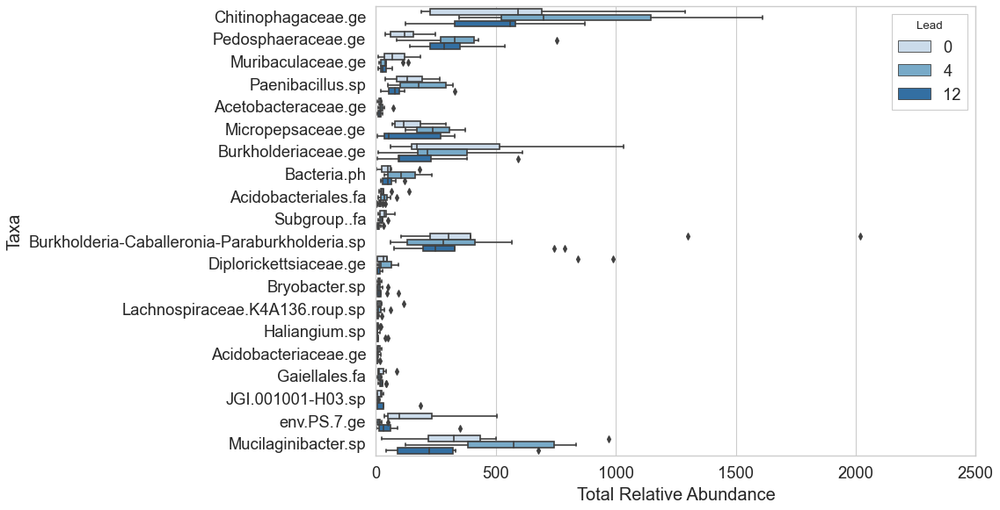

In [44]:
plt.style.use('classic')
sns.set(rc={'figure.figsize':(11, 8)}, font_scale=1.5, style='whitegrid')
sns.boxplot(y='Taxa', x='Total Relative Abundance', 
            data=df6, 
            palette="Blues",
            hue='Lead');
#plt.savefig('svm_confce.jpg', dpi=400)

In [45]:
### 2. Average the replicates in the OTUs, and select out the averaged abundance value of each of the selected OTUs for 9 treatments
df5.drop(['Taxonomy_filter', 'Frequency', 'AvAbund1', 'Size', 'AvAbund2', 'AvDiss', 'DissSD', 'Contrib', 'Cum', 'AvAbundSub'], axis=1, inplace=True)
headers = df5.index.values
df5.columns = df5.columns.str.strip().str.lower().str.replace(' ', '_')
df5['P0B0,Lead: 0,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p0b0')]].mean(axis=1)
df5['P0B1,Lead: 0,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p0b3')]].mean(axis=1)
df5['P0B3,Lead: 0,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p0b1')]].mean(axis=1)
df5['P4B0,Lead: 4,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p4b0')]].mean(axis=1)
df5['P4B1,Lead: 4,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p4b1')]].mean(axis=1)
df5['P4B3,Lead: 4,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p4b3')]].mean(axis=1)
df5['P12B0,Lead: 12,Biochar: 0'] = df5[[col for col in df5 if col.startswith('p12b0')]].mean(axis=1)
df5['P12B1,Lead: 12,Biochar: 1'] = df5[[col for col in df5 if col.startswith('p12b1')]].mean(axis=1)
df5['P12B3,Lead: 12,Biochar: 3'] = df5[[col for col in df5 if col.startswith('p12b3')]].mean(axis=1)
df7 = df5.iloc[:, -9:]

In [46]:
### 3. Keep the replicates and just select out the abundance value of each of the selected OTUs for 27 treatments
cols1 = []
df7 = df7.rename(columns = lambda x: "("+x+")")
col1 = df7.columns.tolist()
cols1 = [tuple(x.replace("(", "").replace(")", "").replace(' ', '').replace(':', ': ').split(",")) for x in col1]

In [47]:
dff4.set_index("Otu", inplace = True)
rows = []
for otu in df7.index:
    if otu in dff4.index:
        rows.append((otu, 'Abund: present'))
    else:
        rows.append((otu, 'Abund: not'))

df3 = pd.DataFrame(data=df7.values, columns=cols1, index=rows).head(250)

>> ### <span style='font-family:"Times New Roman"'> Prominent operational taxonomic units (OTUs) and their interactions with the treatment. <span styel=''>

In [48]:
red1 = df7
red1.columns = ['P0B0', 'P0B1', 'P0B3', 'P4B0','P4B1', 'P4B3', 'P12B0', 'P12B1', 'P12B3'] 
red1.to_csv('leadXbiochar_red1.csv',index=True, sep=',') 
red1 = red1.head(25)

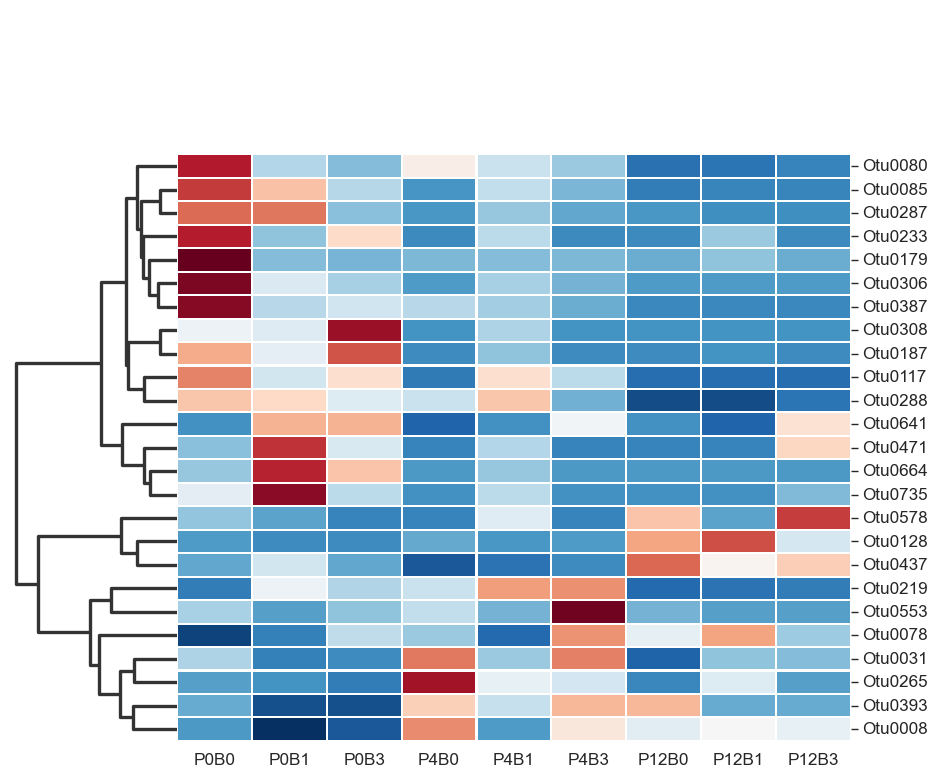

In [49]:
sns.set(font_scale=1.4, font="Arial") # set fontsize 2

g = sns.clustermap(red1, metric="braycurtis", 
               z_score=2, method="average", 
               cmap="RdBu_r",
               col_cluster=False,
               figsize=(12, 10),
               linewidths=1
               #yticklabels=False
              );
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(3)
    
ax = g.ax_heatmap
ax.set_xlabel("")
ax.set_ylabel("")
g.cax.set_visible(False)
    
plt.savefig('heatmap_with_Seaborn_clustermap_python_pbxbiochar_50V23.jpg', dpi=150, figsize=(20,18));

In [50]:
## 4. Interactive heatmap based on Bray Curtis dissimilarity with z score normalization
net.load_df(df3)
net.normalize(axis='row', norm_type='zscore')

>> ### <span style='font-family:"Times New Roman"'><font color='black'> Fifty of the most prominent operational taxonomic units (OTUs) in the form of an interactive heatmap. </font><span styel=''>

In [51]:
net.cluster(dist_type='braycurtis', run_clustering=True, dendro=True, views=['N_row_sum', 'N_row_var'], linkage_type='average', sim_mat=False, filter_sim=0.1, calc_cat_pval=False, run_enrichr=None, enrichrgram=True)
net.widget()

ExampleWidget(network='{"row_nodes": [{"name": "Otu0308", "ini": 250, "clust": 137, "rank": 36, "rankvar": 57,…

# <span style='font-family:"Times New Roman"'><strong><em> Interactive heatmaping and z-score normalization strategies </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________

> ### <span style='font-family:"Times New Roman"'> For visualizing the interations of the OTUs for lead and biochar treatments, we used an interactive visualization technique that shows magnitude of a phenomenon as color in two dimensions. The variation in color gives obvious visual cues to the reader about how the lead and biochar interaction correlates over space. 
>> ### <span style='font-family:"Times New Roman"'> A. Z-score normalization method preserves range (maximum and minimum) and introduces the dispersion of the series (standard deviation / variance). It handles outliers well, but it does not produce normalized data with the exact same scale. Thus, if a value is exactly equal to the mean of all the values of the feature, it will be normalized to 0. 
>>> ### <span style='font-family:"Times New Roman"'> The formula is $\frac{value - u}{σ}$, where μ is the mean value of the feature and σ is the standard deviation of the feature.
    
>> ### <span style='font-family:"Times New Roman"'> B. The rows and columns of the heatmap have been hierarchically clustered, using the Scipy library in Python. Red/blue cells in the matrix represent positive/negative values in your matrix. The 'Sum' and 'Variance' Rearrangement options are 'Rank by sum' and 'Rank by variance'. Click this link: https://clustergrammer.readthedocs.io/ and https://github.com/manugent/BananaClustergrammer, for more information.
    
<span styel=''>

# <span style='font-family:"Times New Roman"'><strong><em> Comparison to similarity percentages alongside Kruskal-Wallis rank sum test </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________
> ### <span style='font-family:"Times New Roman"'> Two R scripts perform the similarity percentages test, applies an abundance and frequency cutoff, and performs the nonparametric general linear model Kruskal-Wallis rank-sum test on each OTU in the dataframe for identifying taxa that most strongly express a between‐group difference. The test provides a fdr (false discovery rate) corrected p-value which comes in handy for detecting if the very abundance OTUS we see actually significantly differ by interest group.
> ### <span style='font-family:"Times New Roman"'> We asked for all SIMPER OTUs (perc_cutoff = 1, meaning up to cumulative 100%) but applied a frequency cutoff, or applied ‘y’ to REMOVE OTUs that contributed less than 1% to SIMPER (low_val=0.01).

In [52]:
kruskal = pd.read_csv('kw_results.csv', sep=',', index_col=[0])
#kruskal.head(5)

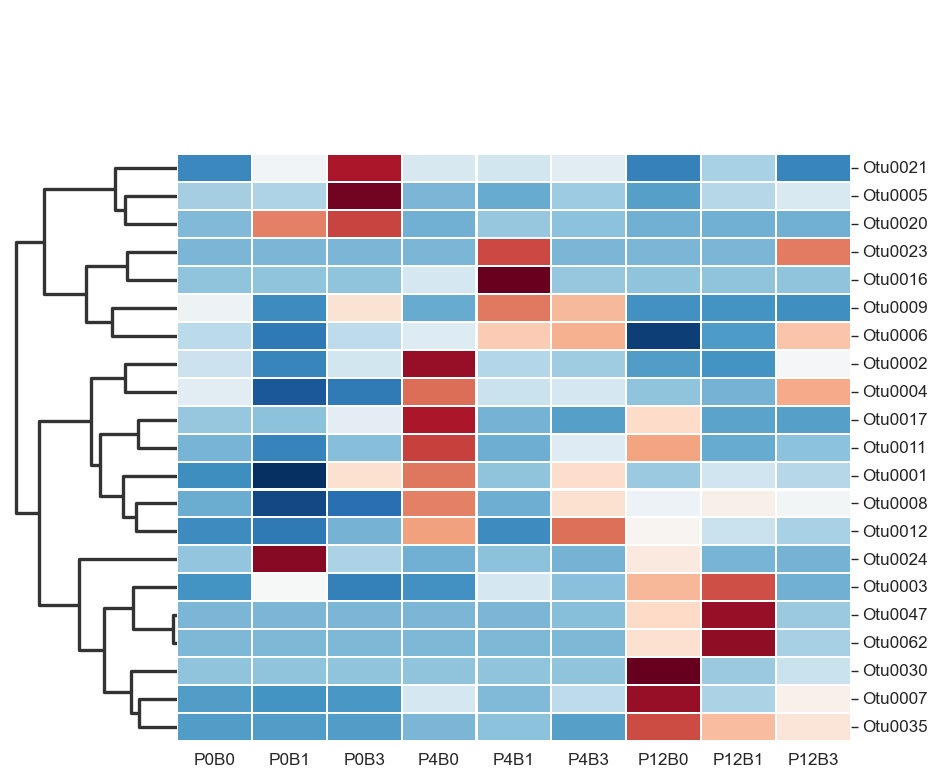

In [53]:
sns.set(font_scale=1.4, font="Arial") # set fontsize 2

g = sns.clustermap(kruskal, metric="braycurtis", 
               z_score=2, method="average", 
               cmap="RdBu_r",
               col_cluster=False,
               figsize=(12, 10),
               linewidths=1
               #yticklabels=False
              );
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(3)
    
ax = g.ax_heatmap
ax.set_xlabel("")
ax.set_ylabel("")
g.cax.set_visible(False)
    
plt.savefig('heatmap_with_Seaborn_kruskal_50V23.jpg', dpi=150, figsize=(20,18));

#### Citation: #https://rstudio-pubs-static.s3.amazonaws.com/343284_cbadd2f3b7cd42f3aced2d3f42dc6d33.html#otus_that_differ_by

# <span style='font-family:"Times New Roman"'><strong><em> Comparison to Best Subset Of Environmental Variables With Maximum (Rank) Correlation With Community Dissimilarities </em><strong> <span styel=''> 
______________________________________________________________________________________________________________________________
> ### <span style='font-family:"Times New Roman"'> This method finds the best subset of environmental variables, so that the Euclidean distances of scaled environmental variables have the maximum (rank) correlation with community dissimilarities. Thus, it links multivariate community structure to environmental variables giving a subset of environmental variables with the best correlation to community data. 
> ### <span style='font-family:"Times New Roman"'> The bioenv() function in the vegan package. Note, however, that there are key differences between this and the PRIMER implementation.

#### Citation: #https://rstudio-pubs-static.s3.amazonaws.com/343284_cbadd2f3b7cd42f3aced2d3f42dc6d33.html#otus_that_differ_by